In [1]:
import pygmt
import pandas as pd
import numpy as np


In [2]:
opam = pd.read_excel('rvb_min.xlsx')
#eruptions = pd.read_excel('prin_supp2.xlsx')
erupt_p = pd.read_excel('erupt_reyk_P.xlsx')

denisty model - nick weir, RISE, line A, NE end. 
2.5 g cm-3 to 3 km
2.86 to 6
3.03 to 20
3.2 deeper.


In [3]:
# model to convert P to depth via density - densities from Wier, RISE line
def z_m(p_kbar):
    g= 9.82 # ms-2
    z1 = 3000 # m - depth to first interface
    rho1 = 2500 # kg m-3 denisty of first layer
    z2 = 6000 # m - depth to second interface
    rho2 = 2860 # kg m-3 density of second layer
    z3 = 20000 # m - depth to Moho
    rho3 = 3030 # kg m-3 - density of third layer (lower crust)
    rho4 = 3200 # kg m-3 - mantle densities
    p1 = rho1*g*z1 # pressure of first interface
    p2 = p1 + rho2*g*(z2-z1) # pressure of 2nd interface
    p3 = p2 + rho3*g*(z3-z2) # pressure of Moho
    
    p_pa = p_kbar * 1.E08 # sample pressure in Pa
    
    if p_pa <= p1:
        z = np.divide(p_pa,g*rho1)
    elif (p_pa > p1) & (p_pa <= p2):
        z = z1 + np.divide(p_pa - p1,g*rho2)
    elif (p_pa > p2) & (p_pa <= p3):
        z = z2 + np.divide(p_pa - p2,g*rho3)
    else:
        z = z3 + np.divide(p_pa - p3,g*rho4)
        
    return z


In [4]:
erupt_pf = erupt_p[pd.notnull(erupt_p.P_av)] # filter for eruptions with mean pressure
erupt_pf['z_m'] = erupt_pf['P_av'].apply(lambda x: z_m(x))
erupt_pf['z_km'] = 0.001*erupt_pf.z_m


<ipython-input-4-49e4ec19b5a2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  erupt_pf['z_m'] = erupt_pf['P_av'].apply(lambda x: z_m(x))
<ipython-input-4-49e4ec19b5a2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  erupt_pf['z_km'] = 0.001*erupt_pf.z_m


In [5]:
grid = pygmt.datasets.load_earth_relief(resolution="01s", region=[-22.75, -21.0, 63.75, 64.12])

pygmt-session [WARNING]: gmt_get_dataset_tiles: No earth_relief_01s_g tiles available for your region.
grdblend [WARNING]: File @N60W030.earth_relief_15s_p.nc has different increments (0.00416666666667/0.00416666666667) than the output grid (0.000277777777778/0.000277777777778) - must resample
grdblend [WARNING]: File @N60W030.earth_relief_15s_p.nc coordinates are phase-shifted w.r.t. the output grid - must resample


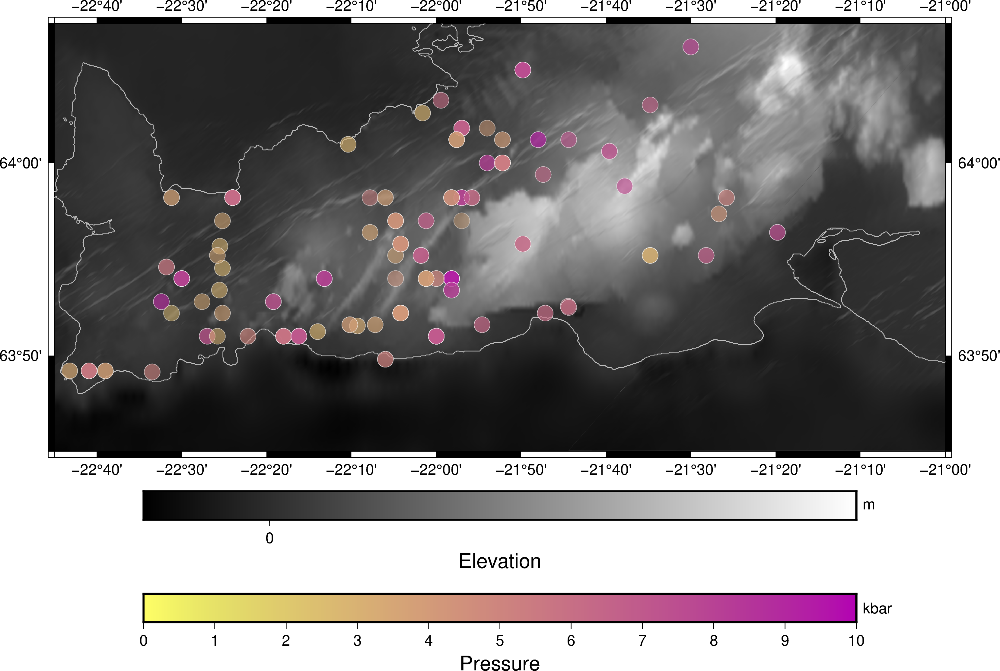

In [9]:


## next, we want to subset the petdb dataset to only include samples from the region.
## In PetDB, longitude goes from -180 to +180.  
#petsam = petbas[(petbas.LONGITUDE > -26.5) & (petbas.LONGITUDE < -24.5) & (petbas.LATITUDE > 62.) & (petbas.LATITUDE < 63.)]


fig = pygmt.Figure()
fig.grdimage(grid=grid, projection="M25c", frame="a", cmap="gray", shading=True) # haxby is a colorscale that is OK for oceans
#fig.grdcontour(grid=grid) # plot up contours
fig.coast(shorelines="1/0.5p,gray")
fig.colorbar(frame=["a1000", "x+lElevation", "y+lm"])
pygmt.makecpt(cmap="buda", series=[0., 10.], background = "i", reverse=True) # color scale for Na2O - change series limits
# Plot using circles (c) of 0.15 cm, the sampled bathymetry points
# Points are colored using elevation values (normalized for visual purposes)
fig.plot(
    x=opam.Longitude,
    y=opam.Latitude,
    style="c0.45c",
    pen="white",
    cmap=True,
    color=opam.Pressure_min,
    transparency=opam.K2O/opam.K2O.max()*100. # sill circle according color-scale
)
fig.colorbar(frame=["a1.0", "x+lPressure", "y+lkbar"],position="JBC+o0c/4c")
fig.show()


In [10]:
opam

,Sample_number,Reference,Volcanic Zone,Volcanic Zone specific,Volcanic System,Location,Site,Systems,time,Age yrs BP (Ref 1950),...,CaO,Na2O,K2O,P2O5,SrO,BaO,H2O,sum,Pressure_min,Probability
0,Krysuvik,Condomines1983,RVB,REP,Krysuvik,Krysuvik,0,Krysuvik,0,0,...,12.707,2.037,0.252,0.212,0,0,0,100.00,4.362081,0.967256
1,RE16,Hardarson1997,RVB,REP,Reykjanes,0,0,Reykjanes,0,0,...,10.750,2.470,0.240,0.210,0,0,0,100.00,2.910799,0.842080
2,D6D,Hemond1993,RVB,REP,Reykjanes,Reykjanes,Sandfellshaed,Reykjanes,0,0,...,12.710,1.830,0.170,0.290,0,0,0,100.01,8.830996,0.943110
3,RP86A,Gee,RVB,REP,Reykjanes,Lagafell_flow_ontop_of_pillows_SW_THorbjarnarfell,Lagafell,Reykjanes,Post-Glacial,<13000 BP,...,12.570,2.010,0.130,0.130,0,0,0,100.01,7.167891,0.994710
4,RP51A,Gee,RVB,REP,Reykjanes,Slaga_3phi_from_top,Slaga,Reykjanes,0,0,...,12.830,2.000,0.270,0.180,0,0,0,100.00,5.757799,0.800636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,S-10-20,"Pollock et al., 2014",RVB,REP,Krysuvik,UndirhlÕar,0,Krysuvik,Glacial,118000-10000,...,11.240,2.350,0.180,0.150,0,0,0,100.12,6.714967,0.907985
236,S-10-21,"Pollock et al., 2014",RVB,REP,Krysuvik,UndirhlÕar,0,Krysuvik,Glacial,118000-10000,...,11.850,2.200,0.200,0.130,0,0,0,100.42,8.247082,0.959886
237,S-08-02-gl,"Pollock et al., 2014",RVB,REP,Krysuvik,UndirhlÕar,0,Krysuvik,Glacial,118000-10000,...,11.480,2.430,0.490,0.140,0,0,0,100.42,1.672766,0.980864
238,S-08-03,"Pollock et al., 2014",RVB,REP,Krysuvik,UndirhlÕar,0,Krysuvik,Glacial,118000-10000,...,11.950,2.300,0.110,0.130,0,0,0,102.96,7.254450,0.986644


In [5]:
fig.savefig("reyk_map_p_sam.png")

In [6]:
erupt_pf_gl = erupt_pf[erupt_pf.num_min_age_wrt2000AD > 14000]
erupt_pf_pg = erupt_pf[(erupt_pf.num_min_age_wrt2000AD <= 14000) & (erupt_pf.num_min_age_wrt2000AD > 1500)]
erupt_pf_re = erupt_pf[erupt_pf.num_min_age_wrt2000AD <= 1500]


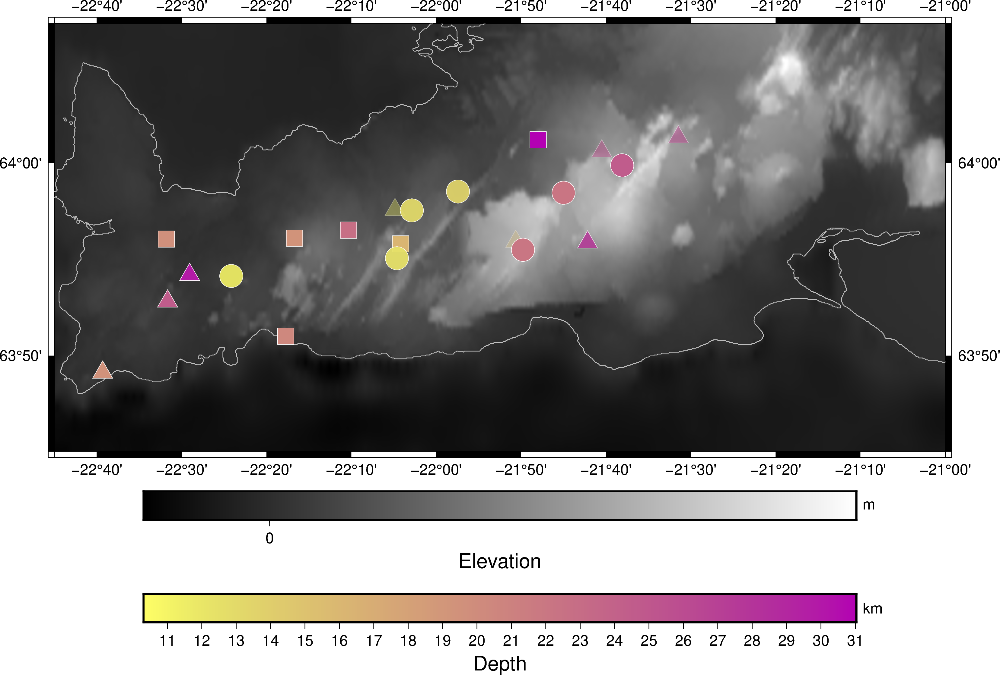

In [7]:


## next, we want to subset the petdb dataset to only include samples from the region.
## In PetDB, longitude goes from -180 to +180.  
#petsam = petbas[(petbas.LONGITUDE > -26.5) & (petbas.LONGITUDE < -24.5) & (petbas.LATITUDE > 62.) & (petbas.LATITUDE < 63.)]


fig = pygmt.Figure()
fig.grdimage(grid=grid, projection="M25c", frame="a", cmap="gray", shading=True) # haxby is a colorscale that is OK for oceans
#fig.grdcontour(grid=grid) # plot up contours
fig.coast(shorelines="1/0.5p,gray")
fig.colorbar(frame=["a1000", "x+lElevation", "y+lm"])
pygmt.makecpt(cmap="buda", series=[erupt_pf['z_km'].min(), erupt_pf['z_km'].max()], background = "o", reverse=True) # color scale for depth
# Plot using circles (c) of 0.15 cm, the sampled bathymetry points
# Points are colored using elevation values (normalized for visual purposes)
fig.plot(
    x=erupt_pf_gl.Longitude,
    y=erupt_pf_gl.Latitude,
    style="s0.65c",
    pen="white",
    cmap=True,
    color=erupt_pf_gl.z_km,
    transparency=80.-(erupt_pf_gl.num_min_age_wrt2000AD/erupt_pf_gl.num_min_age_wrt2000AD.max()*90.) # sill circle according color-scale
)
fig.plot(
    x=erupt_pf_pg.Longitude,
    y=erupt_pf_pg.Latitude,
    style="t0.65c",
    pen="white",
    cmap=True,
    color=erupt_pf_pg.z_km,
    transparency=80.-(erupt_pf_pg.num_min_age_wrt2000AD/erupt_pf_pg.num_min_age_wrt2000AD.max()*90.) # sill circle according color-scale
)
fig.plot(
    x=erupt_pf_re.Longitude,
    y=erupt_pf_re.Latitude,
    style="c0.65c",
    pen="white",
    cmap=True,
    color=erupt_pf_re.z_km,
    transparency=80.-(erupt_pf_re.num_min_age_wrt2000AD/erupt_pf_re.num_min_age_wrt2000AD.max()*90.) # sill circle according color-scale
)
fig.colorbar(frame=["a1.0", "x+lDepth", "y+lkm"],position="JBC+o0c/4c")
fig.show()


In [8]:
erupt_pf


,Zone,Eruption,N_samples,Volume(km3),Longitude,Latitude,num_min_age_wrt2000AD,num_max_age_wrt2000AD,MgO,La,Frac(Volume(km3)),Frac(La),Type,Period_minAgeSorted,Period_maxAgeSorted,P_av,z_m,z_km
38,REYK,Stapafell,20,0.500,-22.529900,63.934250,16300.0,30000.0,10.589222,7.796429,0.769459,6.198532,Glacial,Transitional,Transitional,5.63,19614.513386,19.614513
40,REYK,Slaga,7,0.200,-22.295714,63.850000,16300.0,30000.0,8.907143,8.428571,0.342641,5.060261,Glacial,Transitional,Transitional,5.87,20398.739817,20.398740
41,REYK,Keilir,2,0.100,-22.172398,63.941860,16300.0,30000.0,8.870000,8.850000,0.166577,5.398274,Glacial,Transitional,Transitional,6.60,22721.804990,22.721805
42,REYK,Sandfell,6,0.100,-22.278333,63.935000,16300.0,30000.0,8.455000,5.100000,0.222455,3.606133,Glacial,Transitional,Transitional,5.53,19278.430898,19.278431
43,REYK,Husafell,1,0.040,-21.800000,64.020000,16300.0,30000.0,9.280000,5.400000,0.053805,4.014487,Glacial,Transitional,Transitional,9.21,31027.558554,31.027559
45,REYK,Hrutafell,2,0.010,-22.070000,63.930000,16300.0,30000.0,8.365000,3.450000,0.020607,1.709068,Glacial,Transitional,Transitional,4.61,16186.472008,16.186472
48,REYK,Lagafell,13,0.280,-22.527727,63.880364,14000.0,16300.0,18.847222,0.360000,0.227799,0.508852,Postglacial,Postglacial,Postglacial,7.16,24503.882383,24.503882
49,REYK,Haleyjabunga,18,0.013,-22.655389,63.818611,14000.0,16300.0,16.937333,0.583722,0.011531,0.919852,Postglacial,Postglacial,Postglacial,5.56,19379.255645,19.379256
50,REYK,Sandfellshaed,9,4.800,-22.484444,63.903333,13500.0,13700.0,9.127143,2.700000,7.611692,1.675225,Postglacial,Postglacial,Postglacial,8.83,29818.291752,29.818292
53,REYK,Heidin_ha,7,9.800,-21.702857,63.931429,10300.0,12000.0,8.020000,5.445000,22.839026,2.510822,Postglacial,Postglacial,Postglacial,8.16,27686.163442,27.686163


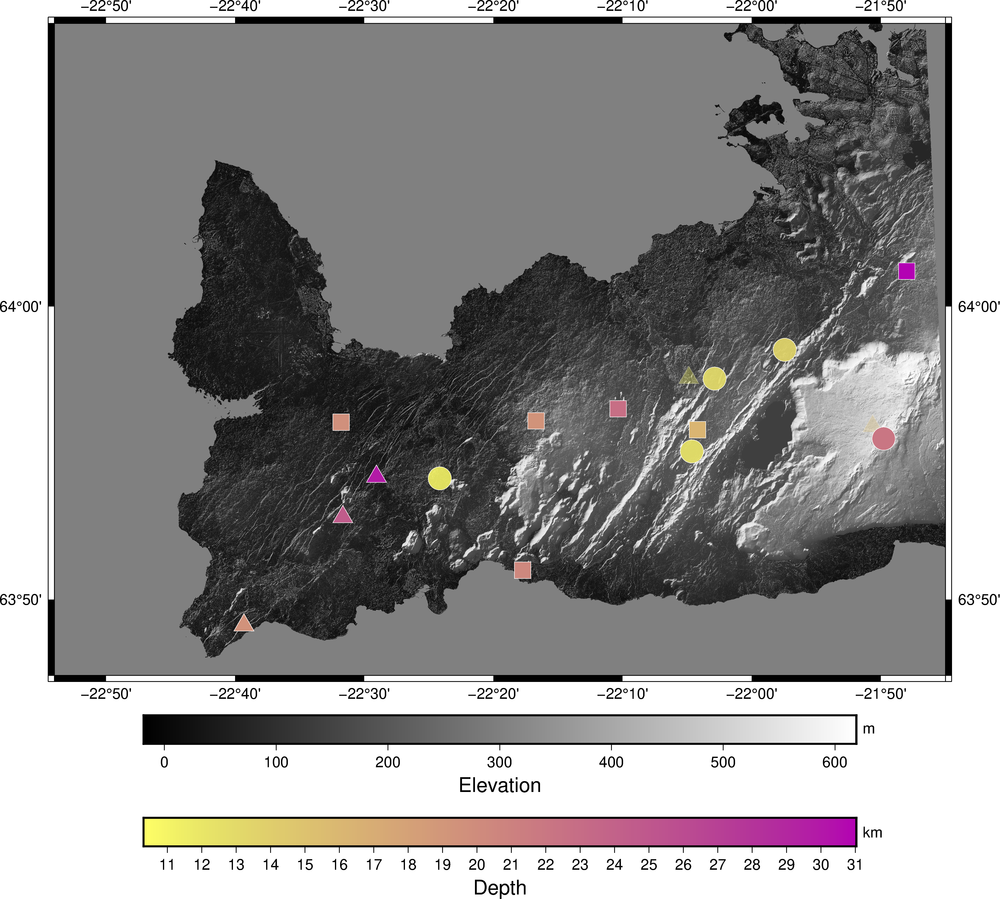

In [14]:
fig = pygmt.Figure()
grid = "reykjanes_dem.grd"
fig.grdimage(grid=grid, projection="M25c", frame="a", cmap="gray", shading = True, region="-22.9/-21.75/63.79/64.16") # haxby is a colorscale that is OK for oceans
fig.colorbar(frame=["a100", "x+lElevation", "y+lm"])
pygmt.makecpt(cmap="buda", series=[erupt_pf['z_km'].min(), erupt_pf['z_km'].max()], background = "o", reverse=True) # color scale for depth
# Plot using circles (c) of 0.15 cm, the sampled bathymetry points
# Points are colored using elevation values (normalized for visual purposes)
fig.plot(
    x=erupt_pf_gl.Longitude,
    y=erupt_pf_gl.Latitude,
    style="s0.65c",
    pen="white",
    cmap=True,
    color=erupt_pf_gl.z_km,
    transparency=80.-(erupt_pf_gl.num_min_age_wrt2000AD/erupt_pf_gl.num_min_age_wrt2000AD.max()*90.) # sill circle according color-scale
)
fig.plot(
    x=erupt_pf_pg.Longitude,
    y=erupt_pf_pg.Latitude,
    style="t0.65c",
    pen="white",
    cmap=True,
    color=erupt_pf_pg.z_km,
    transparency=80.-(erupt_pf_pg.num_min_age_wrt2000AD/erupt_pf_pg.num_min_age_wrt2000AD.max()*90.) # sill circle according color-scale
)
fig.plot(
    x=erupt_pf_re.Longitude,
    y=erupt_pf_re.Latitude,
    style="c0.65c",
    pen="white",
    cmap=True,
    color=erupt_pf_re.z_km,
    transparency=80.-(erupt_pf_re.num_min_age_wrt2000AD/erupt_pf_re.num_min_age_wrt2000AD.max()*90.) # sill circle according color-scale
)
fig.colorbar(frame=["a1.0", "x+lDepth", "y+lkm"],position="JBC+o0c/4c")
fig.show()

In [15]:
fig.savefig("reyk_map_bw.png")

In [13]:
pygmt.grdinfo("reykjanes_dem.grd")

'reykjanes_dem.grd: Title: Produced by grdproject\nreykjanes_dem.grd: Command: grdproject ./merged/dem.grd -G./merged/dem_proj.grd -I -V -F -Jl-19/65/64.25/65.75/1:1 -C2700000/300000 -n+c\nreykjanes_dem.grd: Remark: \nreykjanes_dem.grd: Pixel node registration used [Geographic grid]\nreykjanes_dem.grd: Grid file format: nf = GMT netCDF format (32-bit float), CF-1.7\nreykjanes_dem.grd: x_min: -22.9048805188 x_max: -21.7406290641 x_inc: 4.23364165357e-05 name: longitude n_columns: 27500\nreykjanes_dem.grd: y_min: 63.78191589 y_max: 64.1660902774 y_inc: 1.92087193706e-05 name: latitude n_rows: 20000\nreykjanes_dem.grd: z_min: -18.7052097321 z_max: 619.065856934 name: z\nreykjanes_dem.grd: scale_factor: 1 add_offset: 0\nreykjanes_dem.grd: format: netCDF-4 chunk_size: 129,129 shuffle: on deflation_level: 3\nGEOGCS["unknown",\n    DATUM["Unknown based on WGS84 ellipsoid",\n        SPHEROID["WGS 84",6378137,298.257223563,\n            AUTHORITY["EPSG","7030"]]],\n    PRIMEM["Greenwich",0,\n  